In [1]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import glob

from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

## Camera Calibration

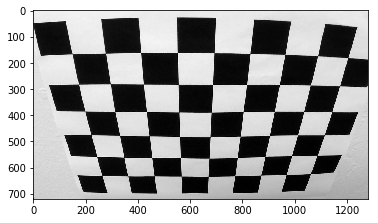

In [2]:
# Load calibration image and display
fname = 'camera_cal/calibration2.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(img, cmap='gray')

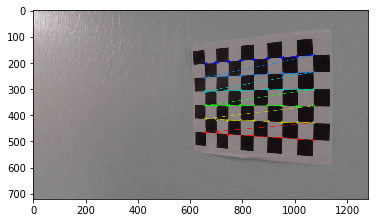

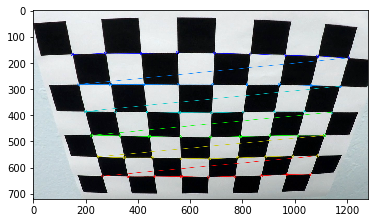

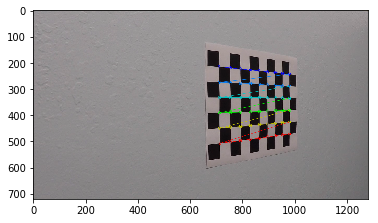

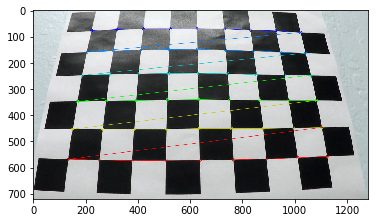

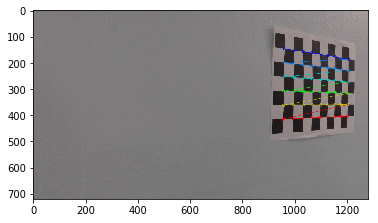

...

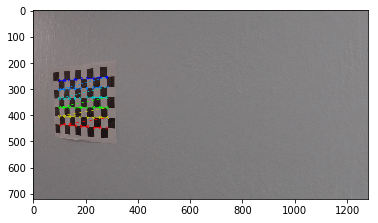

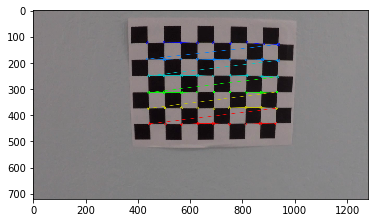

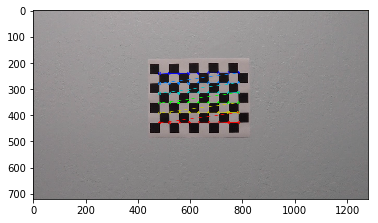

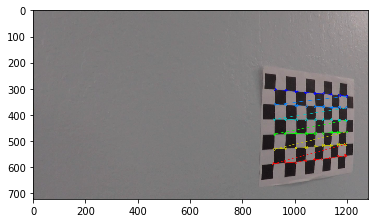

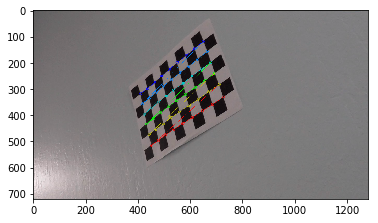

In [3]:
objpoints = []
imgpoints = []
objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

images = glob.glob('camera_cal/calibration*.jpg')
for  fname in images:
    img = cv2.imread(fname)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        plt.imshow(img)
        plt.figure()
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


The values computed from calibration can now be used to undistort an image as shown below.

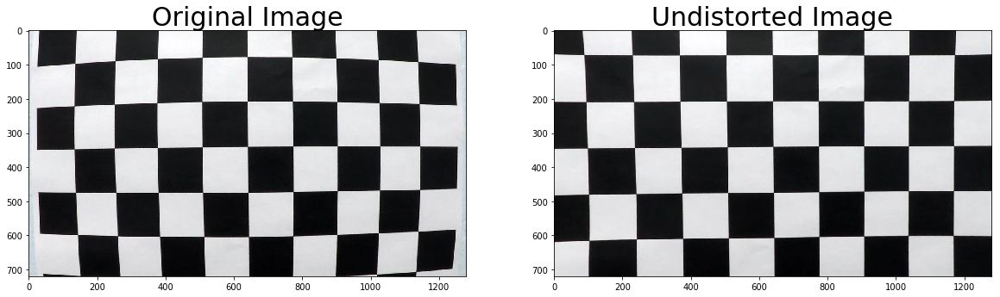

In [4]:
# Read sample image and undistort
img = cv2.imread('camera_cal/calibration1.jpg')
undist = cv2.undistort(img, mtx, dist, None, mtx)

# Show orginal and undistorted images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

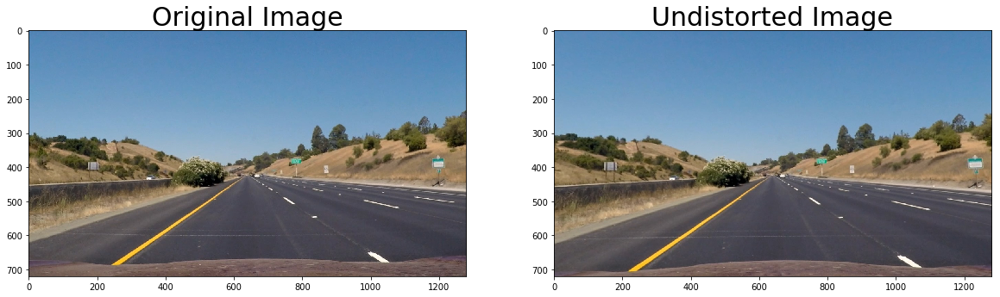

In [10]:
# Read sample image and undistor
img = cv2.imread('test_images/straight_lines1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
undist = cv2.undistort(img, mtx, dist, None, mtx)


# Show orginal and undistorted images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

## Sobel and Color Thresholding

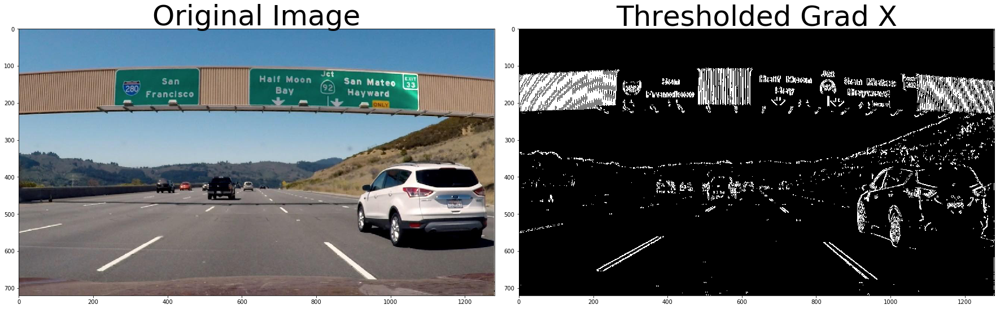

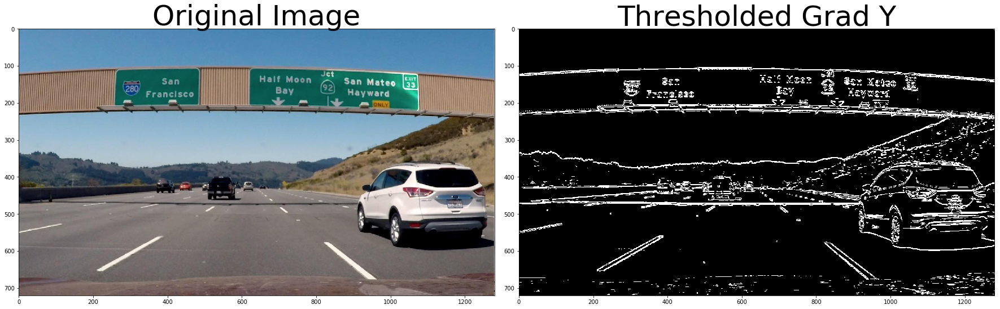

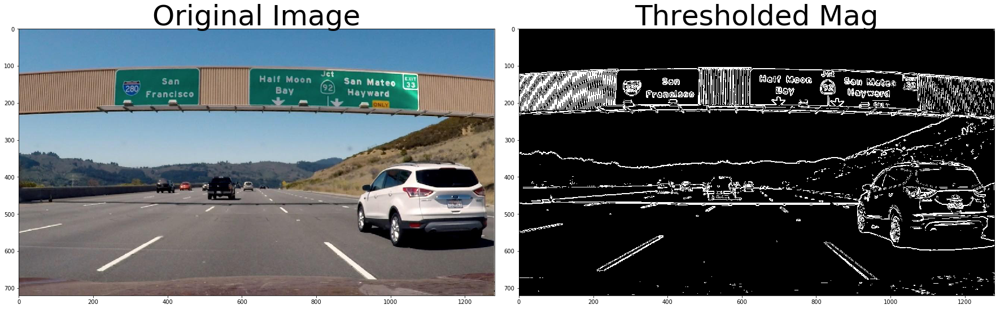

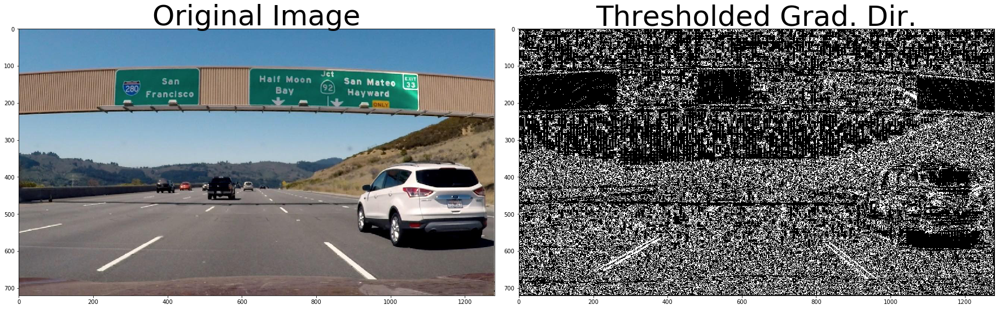

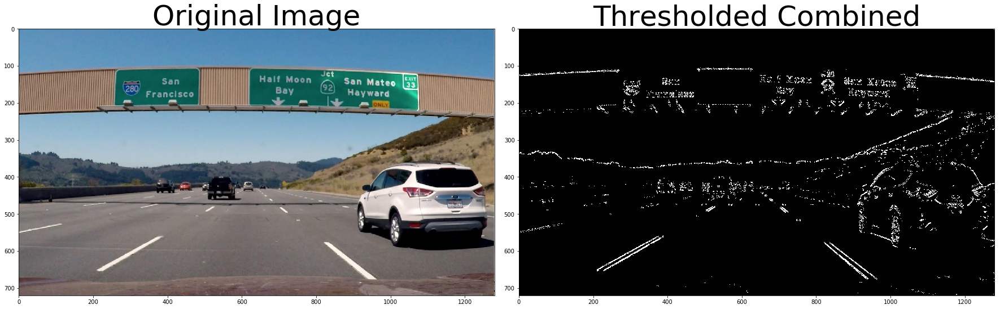

In [11]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return mag_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return dir_binary

#fname = 'test_images/straight_lines1.jpg'
fname = 'signs_vehicles_xygrad.jpg'
image = cv2.imread(fname)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Thresholded Grad X', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grady, cmap='gray')
ax2.set_title('Thresholded Grad Y', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Mag', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded Combined', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Getting HLS Channels

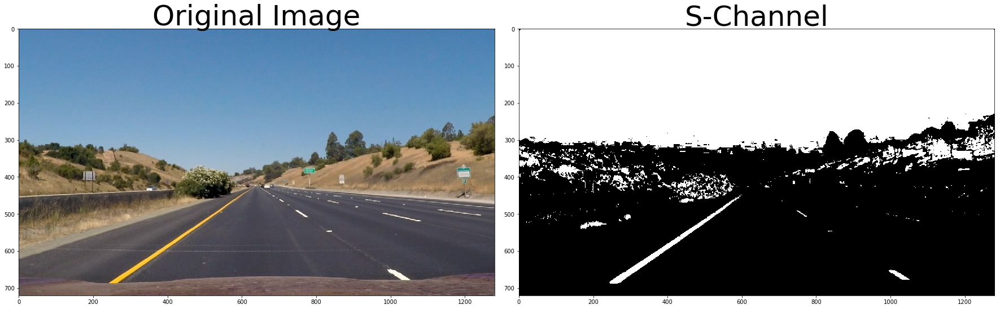

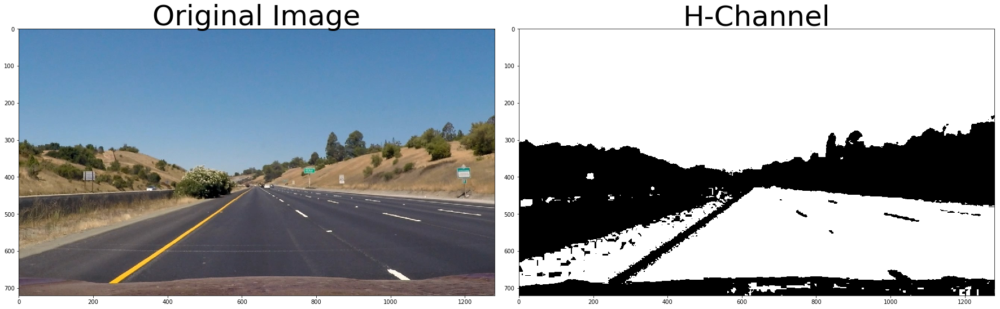

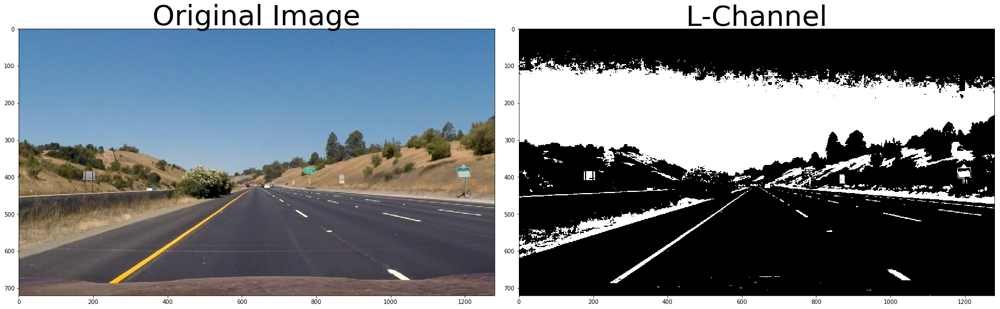

In [112]:
def s_channel(img, thresh=(90, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary

def h_channel(img, thresh=(100, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    binary = np.zeros_like(H)
    binary[(H > thresh[0]) & (H <= thresh[1])] = 1
    return binary

def l_channel(img, thresh=(140, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]
    binary = np.zeros_like(L)
    binary[(L > thresh[0]) & (L <= thresh[1])] = 1
    return binary

fname = 'test_images/straight_lines1.jpg'
image = cv2.imread(fname)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
s_channel_img = s_channel(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_channel_img, cmap='gray')
ax2.set_title('S-Channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

h_channel_img = h_channel(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(h_channel_img, cmap='gray')
ax2.set_title('H-Channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

l_channel_img = l_channel(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(l_channel_img, cmap='gray')
ax2.set_title('L-Channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Combining Thresholds

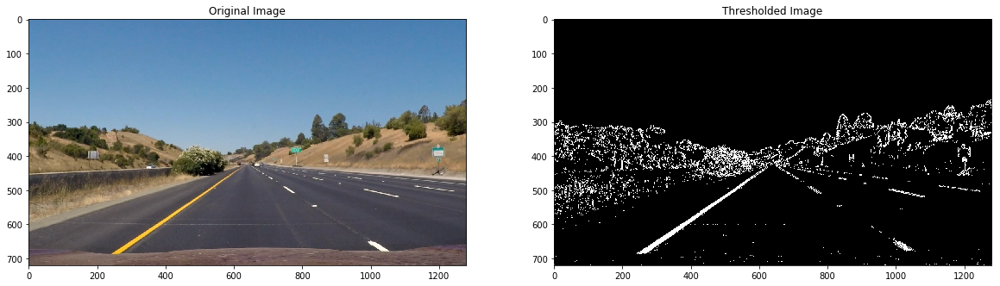

In [14]:
def thresholding(img, sob_thresh=(20, 100), s_thresh=(170, 255), l_thresh=(140, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Sobel x
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sob_thresh[0]) & (scaled_sobel <= sob_thresh[1])] = 1

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary

# Load image
fname = 'test_images/straight_lines1.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Combine s-channel and sobel operations
thresh_img = thresholding(img)

# Show original and Thresholded image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Original Image')
ax1.imshow(img)
ax2.set_title('Thresholded Image')
ax2.imshow(thresh_img, cmap='gray')

## Perspective Transformation

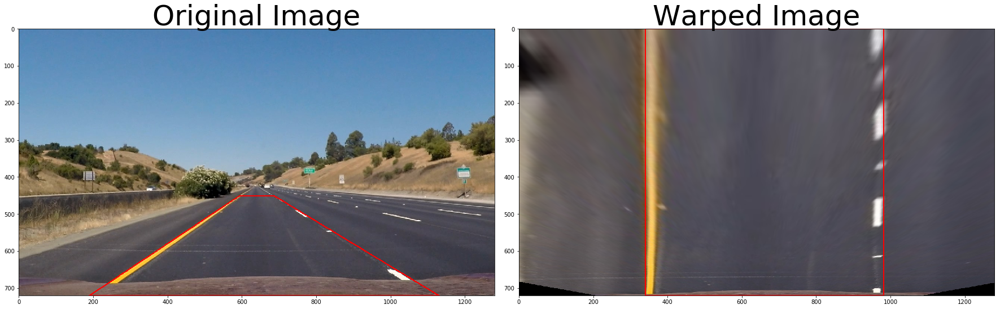

In [15]:
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

def warp(img, offset=150):

    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32([[594, 450], [190, 720], [1130, 720], [686, 450]])
    dst = np.float32([[190+offset, 0], [190+offset, 720], [1130-offset, 720], [1130-offset, 0]])

    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped


def unwarp(img, offset=150):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32([[594, 450], [190, 720], [1130, 720], [686, 450]])
    dst = np.float32([[190+offset, 0], [190+offset, 720], [1130-offset, 720], [1130-offset, 0]])

    Minv = cv2.getPerspectiveTransform(dst, src)
    unwarped = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_LINEAR)
    return unwarped


fname = 'test_images/straight_lines1.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

undist = undistort(img, mtx, dist)
warped_img = warp(undist)

offset = 150
cv2.line(img, (594, 450), (190, 720), color=[255,0,0], thickness=2)
cv2.line(img, (190, 720),(1130, 720), color=[255,0,0], thickness=2)
cv2.line(img, (1130, 720), (686, 450), color=[255,0,0], thickness=2)
cv2.line(img, (686, 450), (594, 450), color=[255,0,0], thickness=2)

cv2.line(warped_img, (190+offset, 0), (190+offset, 720), color=[255,0,0], thickness=2)
cv2.line(warped_img, (190+offset, 720), (1130-offset, 720), color=[255,0,0], thickness=2)
cv2.line(warped_img, (1130-offset, 720), (1130-offset, 0), color=[255,0,0], thickness=2)
cv2.line(warped_img, (1130-offset, 0), (190+offset, 0), color=[255,0,0], thickness=2)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped_img)
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Combining Thresholding and Perspective Transform

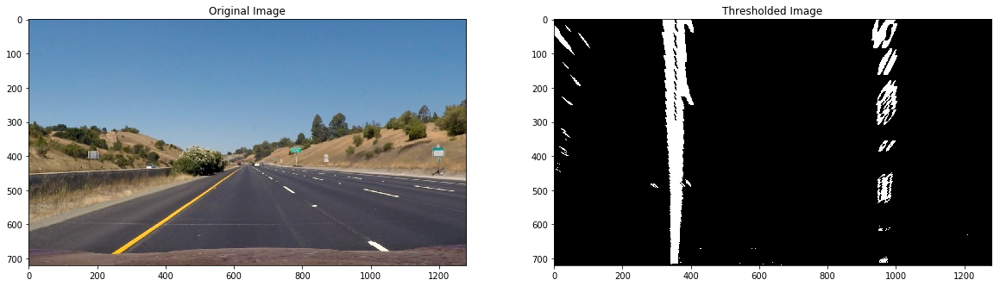

In [16]:
# Load image
fname = 'test_images/straight_lines1.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Combine thresholding and perspective transform
undist = undistort(img, mtx, dist)
thresh_img = thresholding(undist)
warped_img = warp(thresh_img)

# Show original and Thresholded image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Original Image')
ax1.imshow(img)
ax2.set_title('Thresholded Image')
ax2.imshow(warped_img, cmap='gray')

## Finding Lines

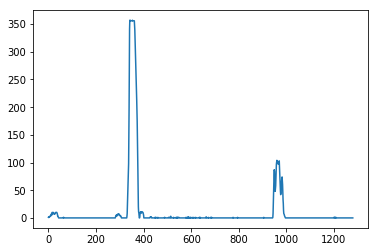

In [17]:
# Create historgram across image
histogram = np.sum(warped_img[warped_img.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [18]:
def fit_line(x_pix, y_pix, ploty):
    fit = np.polyfit(y_pix, x_pix, 2)
    fitx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
    return fit, fitx

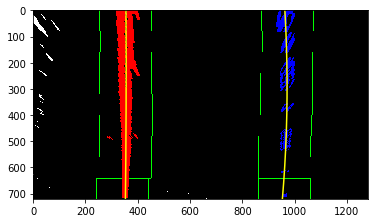

In [19]:
def sliding_window_search(img, show=False):
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Create image for display
    if show:
        out_img = np.dstack((img, img, img))*255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    nwindows = 9
    window_height = np.int(img.shape[0]/nwindows)
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        if show:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    ploty = np.linspace(0,719, 720)
    left_fit, left_fitx = fit_line(leftx, lefty, ploty)
    right_fit, right_fitx = fit_line(rightx, righty, ploty)
    
    if show:
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    
    return left_fit, left_fitx, right_fit, right_fitx, ploty
        

left_fit, left_fitx, right_fit, right_fitx, ploty = sliding_window_search(warped_img, show=True)


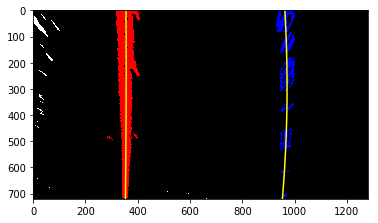

In [21]:
def detect_lines(img, left_fit, right_fit, show=False):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    
    if show:
        out_img = np.dstack((img, img, img))*255
        
    # Finding lines using given fit
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    ploty = np.linspace(0,719, 720)
    left_fit, left_fitx = fit_line(leftx, lefty, ploty)
    right_fit, right_fitx = fit_line(rightx, righty, ploty)
    
    if show:
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    return left_fit, left_fitx, right_fit, right_fitx, ploty

left_fit, left_fitx, right_fit, right_fitx, ploty = sliding_window_search(warped_img)  
left_fit, left_fitx, right_fit, right_fitx, ploty = detect_lines(warped_img, left_fit, right_fit, show=True)


## Calculate Radius of Curvature

In [22]:
def calc_radius(fitx, ploty):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    fit_cr = np.polyfit(ploty*ym_per_pix, fitx*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    return curverad


left_rad = calc_radius(left_fitx, ploty)
right_rad = calc_radius(right_fitx, ploty)
print('Left radius: {:2f}, Right radius: {:2f}'.format(left_rad, right_rad))


Left radius: 14282.032810, Right radius: 1672.042378


## Drawing Lane on Image

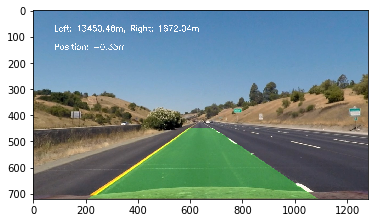

In [58]:
 def draw_lane(img, left_fitx, right_fitx, ploty): 
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = unwarp(color_warp)
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # Calculate radius
    left_rad = calc_radius(left_fitx, ploty)
    right_rad = calc_radius(right_fitx, ploty)
    
    # Calculate position
    left_pos = left_fitx[-1]
    right_pos = right_fitx[-1]
    
    # Show values on image
    cv2.putText(result, 'Left: {:.2f}m, Right: {:.2f}m'.format(left_rad, right_rad), (80,80), fontFace=16, fontScale=1, color=(255,255,255), thickness = 2)
    left_pos = left_fitx[-1]
    right_pos = right_fitx[-1]
    position = ((right_pos + left_pos)/2 - warped_img.shape[0]) * (3.7/700)
    cv2.putText(result, 'Position: {:.2f}m'.format(position), (80,150), fontFace=16, fontScale=1, color=(255,255,255), thickness = 2)
    return result

# Load image
fname = 'test_images/straight_lines1.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Sample pipeline
undist = undistort(img, mtx, dist)
thresh_img = thresholding(undist)
warped_img = warp(thresh_img)
left_fit, left_fitx, right_fit, right_fitx, ploty = sliding_window_search(warped_img)
result = draw_lane(img, left_fitx, right_fitx, ploty)

# Show image
plt.imshow(result)


## Pipeline

In [23]:
class Line:
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        #x values for detected line pixels
        self.allx = None
        #y values for detected line pixels
        self.ally = None
        
    def update(self, line_fit, line_fitx, ploty):
        self.line_base_pos = line_fitx[-1]
        self.detected = True
        self.diffs = np.absolute(self.current_fit - line_fit)
        self.current_fit = line_fit
        if len(self.recent_xfitted) == 10:
            self.recent_xfitted.pop(0)
        self.recent_xfitted.append(line_fitx)
        self.bestx = np.average(np.array(self.recent_xfitted), axis=0)
        curv_rad = calc_radius(line_fitx, ploty)
        self.radius_of_curvature = curv_rad
        self.ploty = ploty
        
    def get_avg_radius(self):
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        y_eval = np.max(self.ploty)
        fit_cr = np.polyfit(self.ploty*ym_per_pix, self.bestx*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        return curverad

In [25]:
 def draw_lane(img, warped_img, left_fitx, right_fitx, ploty, left_rad, right_rad, position): 
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Get Points and fit polygon
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # unwarp image and combine with original
    newwarp = unwarp(color_warp)
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    # Show values on image
    cv2.putText(result, 'Left: {:.2f}m, Right: {:.2f}m'.format(left_rad, right_rad), (80,80), fontFace=16, fontScale=1, color=(255,255,255), thickness = 2)
    left_pos = left_fitx[-1]
    right_pos = right_fitx[-1]
    position = ((right_pos + left_pos)/2 - warped_img.shape[0]) * (3.7/700)
    cv2.putText(result, 'Position: {:.2f}m'.format(position), (80,150), fontFace=16, fontScale=1, color=(255,255,255), thickness = 2)
    return result

In [26]:
def process_img(img):
    undist = undistort(img, mtx, dist)
    thresh_img = thresholding(undist)
    warped_img = warp(thresh_img)
    
    if left_line.detected and right_line.detected:
        left_fit, left_fitx, right_fit, right_fitx, ploty = detect_lines(warped_img, left_line.current_fit, right_line.current_fit)
    else:
        left_fit, left_fitx, right_fit, right_fitx, ploty = sliding_window_search(warped_img)
        
    left_line.update(left_fit, left_fitx, ploty)
    right_line.update(right_fit, right_fitx, ploty)
    
    left_rad = left_line.get_avg_radius()
    right_rad = left_line.get_avg_radius()
    left_pos = left_line.line_base_pos
    right_pos = right_line.line_base_pos
    position = ((right_pos + left_pos)/2 - img.shape[0]) * (3.7/700)
    
    result = draw_lane(img, warped_img, left_line.bestx, right_line.bestx, ploty, left_rad, right_rad, position)
    return result
    

In [27]:
left_line = Line()
right_line = Line()

ld_fname = 'project_video.mp4'
out_fname = 'project_output1.mp4'
clip = VideoFileClip(ld_fname)
output = clip.fl_image(process_img)
%time output.write_videofile(out_fname, audio=False)

[MoviePy] >>>> Building video project_output1.mp4
[MoviePy] Writing video project_output1.mp4


100%|█████████▉| 1260/1261 [03:28<00:00,  5.99it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output1.mp4 

CPU times: user 7min 34s, sys: 1.9 s, total: 7min 35s
Wall time: 3min 29s


### Project Output

In [28]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(out_fname))